<h1><center>Appendix: Deep dive into Turing Study and Google Mobility data</center></h1>
<center><b>Authors:</b> Dhruv Arora, Priyanka Bijlani, Sharmeelee Bijlani, Divya Pandey, Lakshmi Venkatasubramanian</center> <br>
<center><b>Project Sponsor:</b> Sourav Chatterjee</center>

# Table of contents

[Part 1: Algorithm Evaluation with TCPD Study](#part1) <br>
    a. [Evaluating CUSUMDetector](#part1a) <br>
    b. [Evaluating RobustStatDetector](#part1b) <br>
    c. [Evaluating BOCPDetector](#part1c) <br>
    d. [Algorithm Selection Criteria](#part1results) <br>
[Part 2: Applied Research on Google Mobility Data](#part2) <br>
    a. [Application of CUSUMDetector](#part2a) <br>
    b. [Application of RSDDetector](#part2b) <br>
    c. [Application of BOCPDDetector](#part2c) <br>


### 1a. Evaluating CUSUMDetector <a name="part1a"></a>
CUSUM is a method to detect an up/down shift of means in a time series. The algorithm is based on likelihood ratio cusum and is used to detect mean changes in Normal Distribution.The typical behavior of the log-likelihood ratio corresponding to a change in the mean of a Gaussian sequence with constant variance is negative drift before and positive drift after the change. So, the change lies in between the value of the log-likelihood ratio and its current minimum value.

The kats package implementation has two main steps:

1. **Locate the change point:** This is an iterative process where we initialize a change point (in the middle of the time series) and CUSUM time series based on this change point. The next changepoint is the location where the previous CUSUM time series is maximized (or minimized). This iteration continues until either 1) a stable changepoint is found or 2) we exceed the limit number of iterations.
2. **Test the change point for statistical significance:** Conduct log likelihood ratio test to test if the mean of the time series changes at the changepoint calculated in Step 1. The null hypothesis is that there is no change in mean.

By default, we report a detected changepoint if and only if we reject the null hypothesis in Step 2.  If we want to see all the changepoints, we can use the `return_all_changepoints` parameter in `CUSUMDetector` and set it to `True`.

**Underlying assumptions**:

* We assume there is at most one increase change point and at most one decrease change point. You can use the `change_directions` argument in the detector to specify whether you are looking an increase, a decrease, or both (default is both).
* We use Gaussian distribution as the underlying model to calculate the CUSUM time series value and conduct the hypothesis test.

In the code below, we are using the [Rail Lines Total Kilometers](https://github.com/alan-turing-institute/TCPD/tree/master/datasets/rail_lines) dataset from the Turing Study to demonstrate a deep dive into the CUSUMDetector algorithm. 

#### Import Packages

In [13]:
# import packages for data processing
import json
import pandas as pd
import numpy as np
import math
import itertools
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from load_dataset import TimeSeries
import warnings
warnings.filterwarnings("ignore")

# import packages for kats cusum 
from kats.detectors.cusum_detection import CUSUMDetector
from kats.consts import TimeSeriesData,TimeSeriesChangePoint

#### Load the datasets and plot true changepoints

In [14]:
## Load annotated labels 
annotator_df = pd.read_json('TCPD-master/annotations.json')
rail_lines_df =  annotator_df[['rail_lines']]
list2d = np.array(rail_lines_df).flatten()
list2d = [l for l in list2d if (type(l)==list)]
rail_lines_annotation_lst = list(itertools.chain.from_iterable(list2d))
print("Annotations :", rail_lines_annotation_lst)

## Load rail_lines dataset
ts = TimeSeries.from_json('TCPD-master/datasets/rail_lines/rail_lines.json')
print(ts)
rail_lines_df = ts.df
rail_lines_df['date'] =ts.datestr
rail_lines_df['is_CPD'] = np.where(rail_lines_df.t.isin(rail_lines_annotation_lst), 1,0)

Annotations : [10, 25, 10, 26, 10, 25, 25, 26, 25]
TimeSeries(name=rail_lines, n_obs=37, n_dim=1)


     t            V1  date  is_CPD
10  10  9.770744e+05  1990       1
25  25  9.893299e+05  2005       1
26  26  1.062033e+06  2006       1


<Figure size 960x480 with 0 Axes>

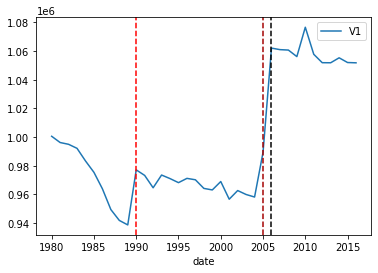

In [15]:
# Plot the true annotated labels
print(rail_lines_df.loc[rail_lines_df['is_CPD']==1])

figure(figsize=(12, 6), dpi=80);
rail_lines_df.plot('date', 'V1')

xposition = rail_lines_df.loc[rail_lines_df['is_CPD']==1][['t']].values

colormap = plt.cm.flag
colors = [colormap(i) for i in np.linspace(0, 1,len(xposition))]
for xc,color in zip(xposition,colors):
    plt.axvline(x=xc, color=color, linestyle='--');

#### Prepare data - Create time-series data from pandas dataframe

TimeSeriesData is the basic data structure in Kats to represente univariate and multivariate time series. One of the ways to initiate it is TimeSeriesData(df), where df is a pd.DataFrame object with a "time" column and any number of value columns. Here we construct TimeSeriesData objects for each time series.

Here we are dealing with a Univariate time series.

In [16]:
# Create TimeSeriesData object to input in KATS algorithms
df = rail_lines_df
df['time']= df['date']
tsd = TimeSeriesData(df.loc[:,['time','V1']])
tsd[:5]

,time,V1
0,1980-01-01,1.000507e+06
1,1981-01-01,9.961533e+05
2,1982-01-01,9.949100e+05
3,1983-01-01,9.920928e+05
4,1984-01-01,9.833025e+05


#### Observations

-  CUSUMDetector can only return one change point in each direction. Out of the 3 true annotated change points, only the change point at year 2005 has been detected as it is significant i.e, it passed the likelihood ratio test for the entire time series in addition to passing the likelihood ratio test within the interest window(if provided as a parameter)

- We can use the interest_window parameter to narrow the search window in the case that the input time series contains multiple change points. However, it must pass the likelihood test for the entire time series as well as within the interest window. The other 2 points did not pass the LRT within the interest window, so these insignificant points weren't detected.

- Point 2005 is significant both at the Time Series and interest window level and detected with a very high confidence of 1.0 at the Time Series level
- Points 2006 and 1990 are insignificant at the interest window level though significant at the Time Series level with a very high confidence. 

#### Cusum detects only 1 point in any given direction

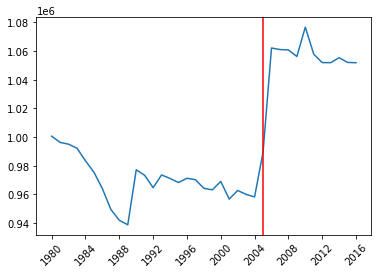

[(TimeSeriesChangePoint(start_time: 2005-01-01 00:00:00, end_time: 2005-01-01 00:00:00, confidence: 1.0), <kats.detectors.cusum_detection.CUSUMMetadata object at 0x7f9000fd6040>), (TimeSeriesChangePoint(start_time: 1981-01-01 00:00:00, end_time: 1981-01-01 00:00:00, confidence: 0.0), <kats.detectors.cusum_detection.CUSUMMetadata object at 0x7f9000ea1850>)]


In [17]:
#CUSUMDetector only supports univariate time series. For multivariate time series, we need to use MultiCUSUMDetector
detector = CUSUMDetector(tsd)

#The CUSUMDetector detected only point 2005 in increase  direction 
change_points = detector.detector(return_all_changepoints=True)

plt.xticks(rotation=45)
detector.plot(change_points)
plt.show()

print(change_points)

#### Passing interest window parameter for detecting other points

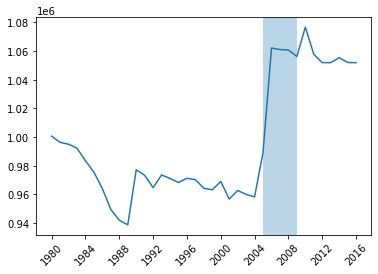

[(TimeSeriesChangePoint(start_time: 2006-01-01 00:00:00, end_time: 2006-01-01 00:00:00, confidence: 0.9999999999989728), <kats.detectors.cusum_detection.CUSUMMetadata object at 0x7f9000ea18b0>), (TimeSeriesChangePoint(start_time: 2008-01-01 00:00:00, end_time: 2008-01-01 00:00:00, confidence: 0.9999997590836197), <kats.detectors.cusum_detection.CUSUMMetadata object at 0x7f9001001fa0>)]


In [18]:
#CUSUMDetector only supports univariate time series. For multivariate time series, we need to use MultiCUSUMDetector
detector = CUSUMDetector(tsd)

change_points = detector.detector(interest_window=[25,30],return_all_changepoints=True)

plt.xticks(rotation=45)
detector.plot(change_points)
plt.show()

print(change_points)

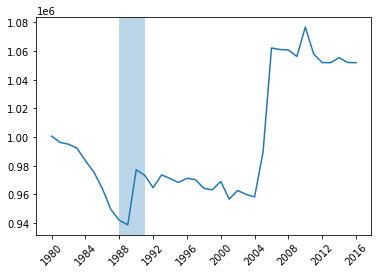

[(TimeSeriesChangePoint(start_time: 1989-01-01 00:00:00, end_time: 1989-01-01 00:00:00, confidence: 0.8736848775962036), <kats.detectors.cusum_detection.CUSUMMetadata object at 0x7f9000d87c10>), (TimeSeriesChangePoint(start_time: 1990-01-01 00:00:00, end_time: 1990-01-01 00:00:00, confidence: 0.9014021947771731), <kats.detectors.cusum_detection.CUSUMMetadata object at 0x7f9000ed2bb0>)]


In [19]:
#CUSUMDetector only supports univariate time series. For multivariate time series, we need to use MultiCUSUMDetector
detector = CUSUMDetector(tsd)

#In the case below where there is only an increase, it will detect that increase.
change_points = detector.detector(interest_window=[8,12],return_all_changepoints=True)

plt.xticks(rotation=45)
detector.plot(change_points)
plt.show()

print(change_points)

#### Generating interest windows and tuning the detector parameters

- **threshold** - The default value of this parameter is 0.01. Changing it to a high value say >= 0.5 and rerunning for the points that were not detected previously detects them now
- **interest_window** - You want to have this window with atleast 2 points before and after the change point, else change point won't be detected. For change point 10, a window of [8,12] works, but [9,12] doesn't.

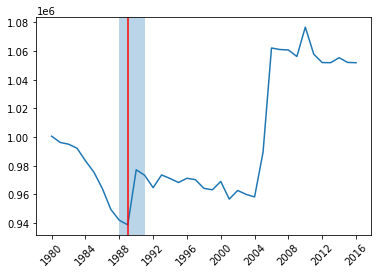

[(TimeSeriesChangePoint(start_time: 1989-01-01 00:00:00, end_time: 1989-01-01 00:00:00, confidence: 0.8736848775962036), <kats.detectors.cusum_detection.CUSUMMetadata object at 0x7f9001171df0>), (TimeSeriesChangePoint(start_time: 1990-01-01 00:00:00, end_time: 1990-01-01 00:00:00, confidence: 0.9014021947771731), <kats.detectors.cusum_detection.CUSUMMetadata object at 0x7f90011833d0>)]


In [20]:
#CUSUMDetector only supports univariate time series. For multivariate time series, we need to use MultiCUSUMDetector
detector = CUSUMDetector(tsd)

#In the case below where there is only an increase, it will detect that increase.
change_points = detector.detector(interest_window=[8,12],return_all_changepoints=True,threshold=0.5,delta_std_ratio=0.5)

plt.xticks(rotation=45)
detector.plot(change_points)
plt.show()

print(change_points)

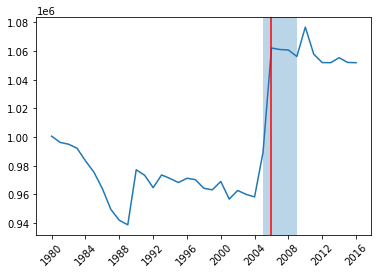

[(TimeSeriesChangePoint(start_time: 2006-01-01 00:00:00, end_time: 2006-01-01 00:00:00, confidence: 0.9999999999989728), <kats.detectors.cusum_detection.CUSUMMetadata object at 0x7f900106feb0>), (TimeSeriesChangePoint(start_time: 2008-01-01 00:00:00, end_time: 2008-01-01 00:00:00, confidence: 0.9999997590836197), <kats.detectors.cusum_detection.CUSUMMetadata object at 0x7f9000ed22e0>)]


In [21]:
#CUSUMDetector only supports univariate time series. For multivariate time series, we need to use MultiCUSUMDetector
detector = CUSUMDetector(tsd)

change_points = detector.detector(interest_window=[25,30],return_all_changepoints=True,threshold=0.9)

plt.xticks(rotation=45)
detector.plot(change_points)
plt.show()

print(change_points)

In [22]:
# Segment the time series by interest windows
cpts = [10,25, 26]
after = range(1,20,4)
before = range(1,20,4)
int_window = []
for cp in cpts:
    for windowa in after:
        for windowb in before:
            if (cp+windowa) > 0 and (cp-windowb) > 0:
                int_window.append([cp-windowb,cp+windowa])

In [23]:
# Tune hyperparameters: comparison_window and smoothing_window_size

# Parse list of changepoints and confidence
def parse_CPs(changepoints,df):    
    cp_list = []
    for cp in changepoints:
        changepoint1 = str(cp[0])[34:38]
        changepoint = df.loc[df['time'].isin([changepoint1]),'t'].values[0]
        confidence = str(cp[0])[98:105]
        regression_detected = cp[1].regression_detected
        if regression_detected:
            cp_list.append(str(changepoint)+":"+str(changepoint1))
            #cp_list.append("cp: "+str(changepoint)+" => conf:"+str(confidence)+" => sig: "+str(regression_detected))
    return cp_list

# Hyperparameter tuning for RSD algo
def hp_tuning_cusum(tsd,df):

    # Initialize the detector
    detector = CUSUMDetector(tsd)
    hp_list = []
    hp_value = {}
    for threshold in np.linspace(0,1,100):
        for interest_window in int_window:
            #for min_abs_change in np.linspace(0,1,25):
            change_points = detector.detector(
                threshold=threshold,
                interest_window=interest_window,
                return_all_changepoints=True
                #min_abs_change=min_abs_change
                )
            hp_value = {'threshold': threshold, 'interest_window':interest_window, 'CP': parse_CPs(change_points,df)}
            hp_list.append(hp_value)
    return pd.DataFrame(hp_list)

In [24]:
# Run the hyperparameter tuning methods and export the results to a .csv file
dataset_hp_cusum = hp_tuning_cusum(tsd,df)
print(dataset_hp_cusum.head())
dataset_hp_cusum.to_csv("rail_lines_out.csv")

   threshold interest_window  CP
0        0.0         [9, 11]  []
1        0.0         [5, 11]  []
2        0.0         [1, 11]  []
3        0.0         [9, 15]  []
4        0.0         [5, 15]  []


#### Hyperparameter tuning of the threshold and interest_window

The true changepoints 2005, 2006 and 1990 are detected for the following parameters:
- cp '26:2006' is detected only when threshold is between 0.3 to 1.0 (inclusive) with window size having 1 point before and atleast 4 points after the cp. If the window size is too wide or too narrow, change point is not detected. Only window range [25,30] to [25, 43] detects this changepoint. 

- cp '25:2005' is detected for all thresholds from 0.01 to 1. Most of the interest windows detects this point by default without needing any hyper parameter tuning.

- cp '10:1990' is detected for threshold ranging between 0.7 to 1 (inclusive). Window that is successul in detecting the changepoint has 1 point before the cp and atleast 4 points after cp upto 13 points. For example, for a cp 10, window [9,14] to [9,23] is successful. 

**In order to choose the optimum threshold, we can choose 0.7 and above. Interest window should be 1 point before and atleast 4 points after cp upto 12 points after cp. **

In [25]:
# Create interest windows for plotting
windows = dataset_hp_cusum.loc[dataset_hp_cusum.CP.isin([['10:1990']])][['interest_window','threshold','CP']]
df1 = windows.groupby([windows['interest_window'].map(tuple),windows['CP'].map(tuple)]).agg({'threshold':['min','max']}).reset_index()

windows = dataset_hp_cusum.loc[dataset_hp_cusum.CP.isin([['26:2006']])][['interest_window','threshold','CP']]
df1 = windows.groupby([windows['interest_window'].map(tuple),windows['CP'].map(tuple)]).agg({'threshold':['min','max']}).reset_index()

windows = dataset_hp_cusum.loc[dataset_hp_cusum.CP.isin([['25:2005']])][['interest_window','threshold','CP']]
df1 = windows.groupby([windows['interest_window'].map(tuple),windows['CP'].map(tuple)]).agg({'threshold':['min','max']}).reset_index()

windows = dataset_hp_cusum.loc[dataset_hp_cusum.CP.isin([['26:2006'],['10:1990'],['25:2005']])][['interest_window','threshold','CP']]
df1 = windows.groupby(windows['CP'].map(tuple)).agg({'threshold':['min','max'],'interest_window':['min','max']}).reset_index()
print(df1.head())

           CP threshold      interest_window          
                    min  max             min       max
0  (10:1990,)  0.353535  1.0         [9, 15]   [9, 23]
1  (25:2005,)  0.010101  1.0         [1, 27]  [24, 42]
2  (26:2006,)  0.090909  1.0        [25, 31]  [25, 43]


In [26]:
# Plot the results of hyperparameter tuning
import hiplot as hip

cp_hiplot = hip.Experiment.from_csv('rail_lines_out.csv')
cp_hiplot.display()

<IPython.core.display.Javascript object>

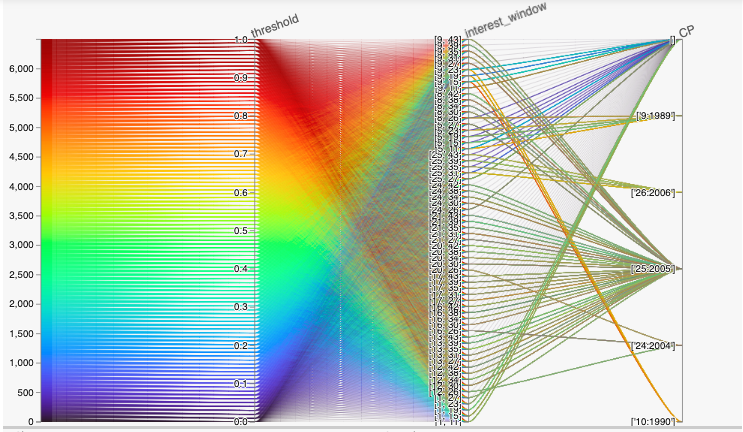

#### Hyperparameter tuning of delta_std_ratio and min_abs_change

In [27]:
# Hyperparameter tuning for cusum algo
def hp_tuning_cusum1(tsd,df):

    # Initialize the detector
    detector = CUSUMDetector(tsd)
    hp_list = []
    hp_value = {}
    n=len(tsd)
 
    for min_abs_change in np.linspace(0,1,10):
        for delta_std_ratio in np.linspace(0,1,10):
            change_points = detector.detector(
                threshold=0.7,
                interest_window=[9,15],
                return_all_changepoints=True,
                min_abs_change=min_abs_change,
                delta_std_ratio=delta_std_ratio
                )
            hp_value = {'delta_std_ratio':delta_std_ratio,'min_abs_change':min_abs_change, 'CP': parse_CPs(change_points,df)}
            hp_list.append(hp_value)
    return pd.DataFrame(hp_list)

In [28]:
# Run the hyperparameter tuning methods and export the results to a .csv file

dataset_hp_cusum1 = hp_tuning_cusum1(tsd,df)
dataset_hp_cusum1.to_csv("rail_lines_out1.csv")

Here irrespective of the values set for min_abs_change whose default value is 0 and  delta_std_ratio  whose default value is 1, the cp get detected only when threshold is over 0.6

In [29]:
cp_hiplot1 = hip.Experiment.from_csv('rail_lines_out1.csv')
cp_hiplot1.display()

<IPython.core.display.Javascript object>

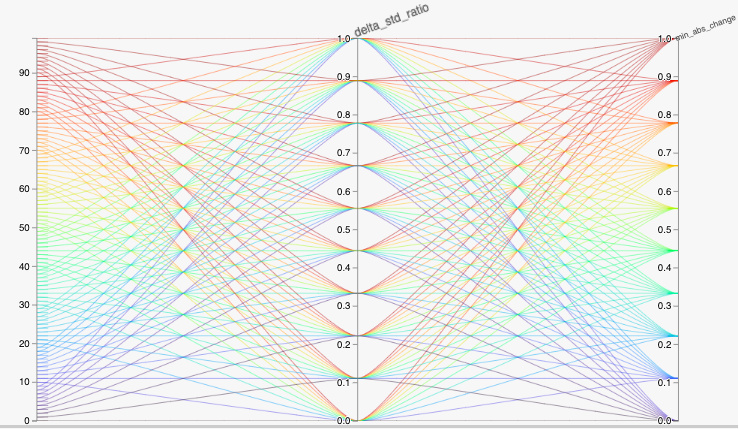

In [30]:
# Plot the time series with multiple changepoints
tsd_copy = tsd
multi_cp_ts=tsd_copy
historical_window = 1
scan_window = 5
step = 3
changepoints = []
n = len(multi_cp_ts)
for end_idx in range(historical_window + scan_window, n, step):
    start_idx = end_idx - (historical_window + scan_window) 
    #print(start_idx , end_idx,[historical_window, historical_window + scan_window])
    tsd = multi_cp_ts[start_idx : end_idx]
    changepoints += CUSUMDetector(tsd).detector(interest_window=[historical_window, historical_window + scan_window],threshold=0.5)

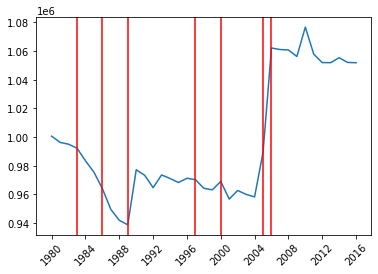

In [31]:
# plot the results
detector = CUSUMDetector(multi_cp_ts) # we are not really using this detector
detector.detector() # this call to detector is not being used for anything

plt.xticks(rotation=45)
detector.plot(changepoints)
plt.show()

#### Main takeaways

- Cusum detects only 1 change point in any direction. In order to detect all the changepoints, we need to specify interest window parameter for all the other change points. Based on hyper parameter tuning, the interest window has to be in the range of [changepoint-1, changepoint+(4 to 10 points)] for a changepoint.

- While the threshold parameter depends on the interest window range, a higher threshold of 0.7 and over should generally work for all interest windows. Please note that the default threshold value is 0.01.

- Hyperparameter tuning of start point, delta_std_ratio and min_abs_change wasn't very helpful.

- If the data has seasonal component to it, then using an interest window in a time series with seasonality will give us a false positive. This can be mitigated by comparing the magnitude of the time series in the interest window to the magnitude of the the time series prior to the interest window. This is done by using parameters magnitude_quantile, magnitude_comparable_day, and magnitude_ratio. Based on the parameters we are using, we will keep a changepoint detected in interest_window only if at least half of the intervals prior to interest_window with the same length as interest_window have a maximum value not exceeding p / magnitude_ratio. Include this changepoint if and only if this proportion of days exceeds magnitude_comparable_day.


### 1b. Evaluating RobustStatDetector <a name="part1b"></a>
The Robust Stat Detector detects shifts in mean in a time-series. It takes into account a fixed number of points, `comparison_window`, over which to calculate the mean, `smoothing_window_size`, and detects changepoints within a given confidence level, `p_value_cutoff`. 

The code below utilizes the [GDP of Japan dataset](https://github.com/alan-turing-institute/TCPD/tree/master/datasets/gdp_japan) from the Turing study to explore the Robust Stat Detector algorithm and its parameters. It also evaluates the performance of the algorithm on [Population of Centralia, PA](https://github.com/alan-turing-institute/TCPD/tree/master/datasets/centralia) and [Volume of the Nile River]() datasets from the same study. 

#### Import the data and plot true changepoint

In [32]:
# List the indices of the true changepoints in the GDP of Japan timeseries from the Turing study

import json 
import pandas as pd 
import numpy as np 
import itertools 

dataset = 'gdp_japan'
annotator_df = pd.read_json('TCPD-master/annotations.json') 
dataset_df = annotator_df[[dataset]] 
list2d = np.array(dataset_df).flatten() 
list2d = [l for l in list2d if (type(l)==list)] 
dataset_annotation_lst = list(itertools.chain.from_iterable(list2d))
dataset_annotation_lst

[32, 32]

True Changepoint at: 1992


<Figure size 960x480 with 0 Axes>

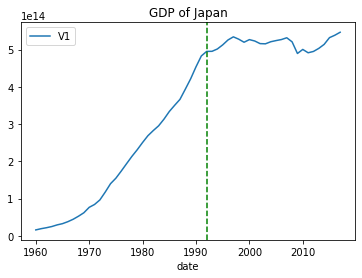

In [33]:
# Plot the timeseries and the true changepoint

import matplotlib.pyplot as plt 
from matplotlib.pyplot import figure 
from load_dataset import TimeSeries 

path = str('TCPD-master/datasets/' + dataset + '/' + dataset + '.json')
ts = TimeSeries.from_json(path)
dataset_df = ts.df
dataset_df['date'] =ts.datestr
#print(dataset_df.dtypes)
column_name = 'V1'
figure(figsize=(12, 6), dpi=80)
dataset_df.plot('date', 'V1')
dataset_df['is_CPD'] = np.where(dataset_df.t.isin(dataset_annotation_lst), 1,0)
plt.axvline(dataset_df.loc[dataset_df['is_CPD']==1][['t']].values[0], color='green', linestyle='--')
plt.title("GDP of Japan")
true_cp = dataset_df.iloc[32]['date']
print("True Changepoint at: " + true_cp )

#### Detect and plot changepoint found using RSD

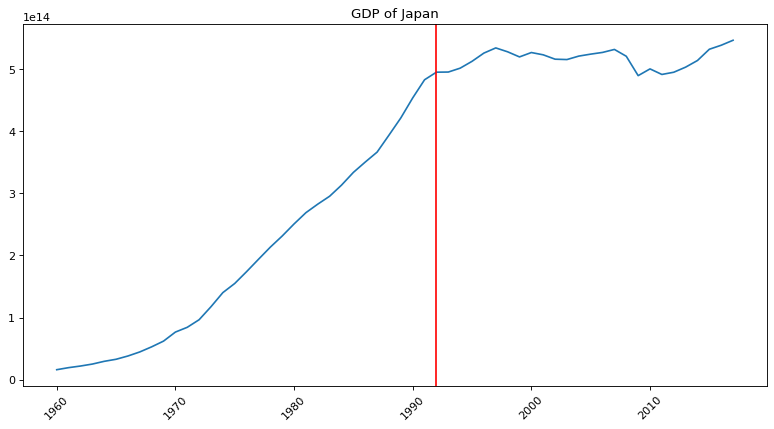

Detected changepoint(s): 


[(TimeSeriesChangePoint(start_time: 1992-01-01T00:00:00.000000000, end_time: 1992-01-01T00:00:00.000000000, confidence: 0.9581645425913177),
  <kats.detectors.robust_stat_detection.RobustStatMetadata at 0x7f8fe3430c40>)]

In [34]:
# Detect changepoints in the GDP of Japan timeseries with at least 95% confidence with Robust Stat Detector algorithm

from kats.detectors.robust_stat_detection import RobustStatDetector
from kats.consts import TimeSeriesData

df = dataset_df
df['time']= pd.to_datetime(df['date'])
tsd = TimeSeriesData(df.loc[:,['time', column_name]])
detector = RobustStatDetector(tsd)
change_points = detector.detector(comparison_window=5, smoothing_window_size=5, p_value_cutoff=0.05)
figure(figsize=(12, 6), dpi=80)
plt.xticks(rotation=45)
plt.title("GDP of Japan")
detector.plot(change_points)
print("Detected changepoint(s): ")
change_points

#### Hyperparameter tuning of comparison_window and smoothing_window_size

In [35]:
# Tune hyperparameters: comparison_window and smoothing_window_size

# Parse list of changepoints and confidence
def parse_CPs(changepoints):    
    cp_list = []
    for cp in changepoints:
        changepoint = str(cp[0])[34:38]
        confidence = str(cp[0])[119:125]
        cp_list.append(changepoint)
    return cp_list

# Hyperparameter tuning for RSD algo
def hp_tuning_RSD(tsd):

    # Initialize the detector
    detector = RobustStatDetector(tsd)

    hp_list = []
    #hp_result['true_CP_detected'] = []
    comparison_window = 0
    smoothing_window_size = 0
    p_value_cutoff = 0.05
    hp_value = {}
    for i in range(1,20):
        for j in range(1, 20):
            #for k in range(1, 10):
                #threshold = k*0.1
            smoothing_window_size = i
            comparison_window = j
            change_points = detector.detector(
                comparison_window=comparison_window,
                smoothing_window_size=smoothing_window_size,
                p_value_cutoff=0.05
            )
            hp_value = {'comparison_window': comparison_window, 'smoothing_window': smoothing_window_size, 'CP': parse_CPs(change_points)}
            hp_list.append(hp_value)
    return pd.DataFrame(hp_list)

In [36]:
# Run the hyperparameter tuning methods and export the results to a .csv file

dataset_hp_rsd = hp_tuning_RSD(tsd)
dataset_hp_rsd.to_csv("gdp_japan_hp_rsd.csv")

In [37]:
# Plot the results of hyperparameter tuning

import hiplot as hip

cp_hiplot = hip.Experiment.from_csv('gdp_japan_hp_rsd.csv')
cp_hiplot.display()

<IPython.core.display.Javascript object>

The true changepoint, '1992', is only detected when the `comparison_window` or `smoothing_size_window` ranges from 1-8 or is at the value of 19 in a dataset of 54 rows. Interestingly, the valid range for both parameters is the same and either one should be within the valid range to detect the true changepoint. 

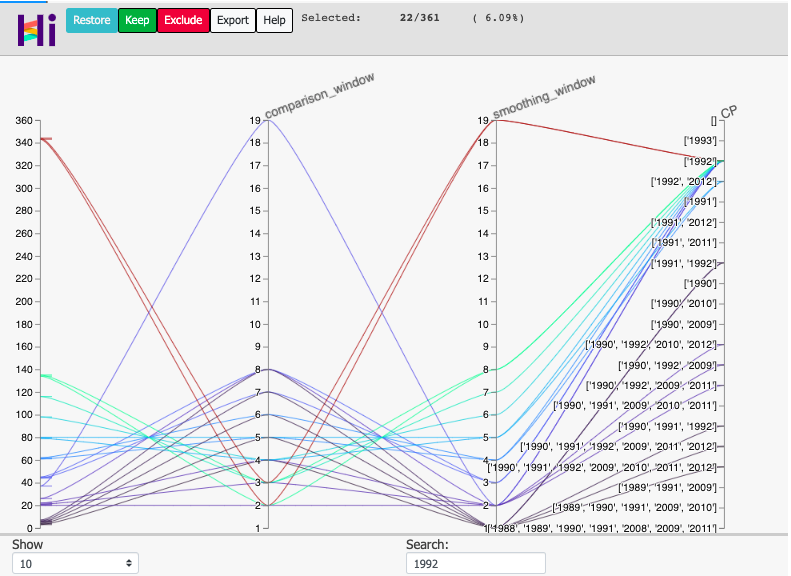

#### Varying dataset sizes
Upon repeating the same hyperparamter sweep for the Robust Stat Detector algorithm on various timeseries datasets with a different number of datapoints, we observed the following results. 

The dataset tracking the population of Centralia, PA has only 15 datapoints. Tuning hyperparameters to find the combinations with the true changepoint detected results in the Hiplot below. Here it is observed that when either the comparison_window or smoothing_window_size is: 1, 4-6, 8, or 10, is the only time the true changepoint of 1990 is detected by the algorithm. This observation is consistent with other datasets where both parameters have the same valid range. It can also be observed that number of false positives or incorrectly detected changepoints increase as the comparison_window size increases. 

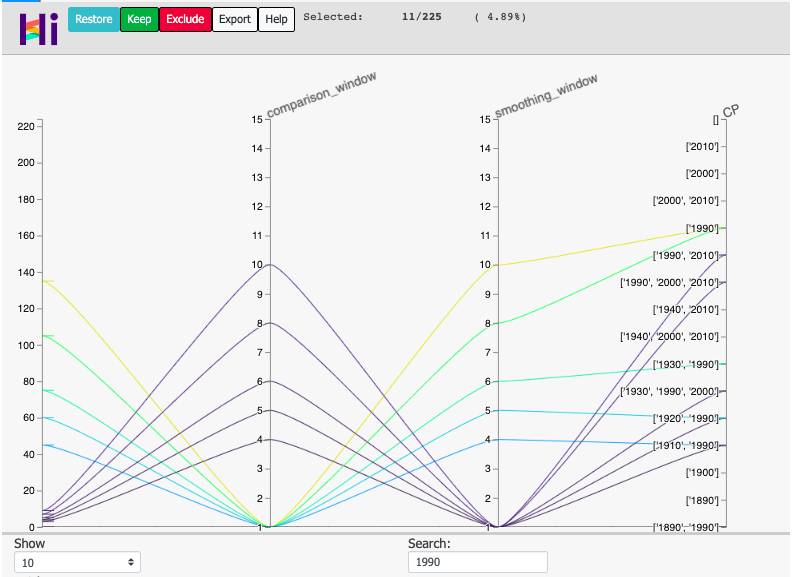

The timeseries capturing the volume of the Nile River across 100 years has a true changepoint during the year of 1899. This true changepoint is observed when the comparison_window or smoothing_window_size is between the 1-27 range. Additionally, we added another result column with the number of changepoints detected to observe the effect of parameters on the number of false positives detected. As seen in the Hiplot for the volume of the Nile River below, it is observed that having a smaller comparison_window than smoothing_window_size results in fewer false positive changepoints detected by the Robust Stat Detector algorithm. 

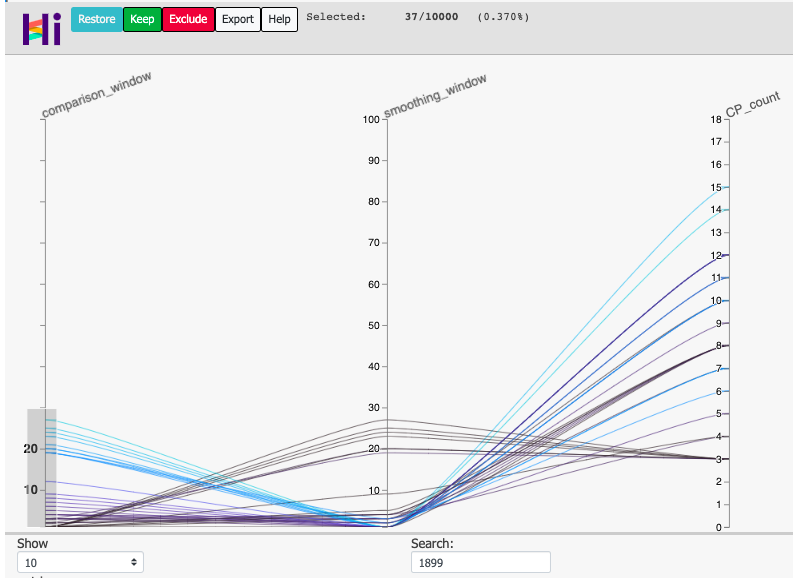

#### Main Takeaways

1. The valid range of values which detect true changepoints is the same for both comparison_window and smoothing_window_size.
2. Either but not necesarily both parameters need to be in the valid range to detect the true changepoint.
3. The valid range is usually <25% of the total rows or datapoints in a larger timeseries (more datapoints).
4. Having a smaller comparison_window than smoothing_window_size results in fewer false positives detected by the RSD algorithm. 

### 1c. Evaluating BOCPDetector <a name="part1c"></a>

Bayesian Online Change Point Detection (BOCPD) is a method for detecting sudden changes in a time series that persist over time. The BOCPD supports two types of models: Online model and Bayesian model.  The online model does not need to know the entire time series apriori. It only looks few steps ahead to make predictions. The Bayesian model is offline model and supports specifying prior beliefs in the model as with any other bayesian models. The online model has three `model` types, each of which are assessed in this analysis. 

* NORMAL_KNOWN_MODEL: Normal model with variance known. Use this to find level shifts in normally distributed data.
* TREND_CHANGE_MODEL : This model assumes each segment is generated from ordinary linear regression. Use this model to understand changes in slope, or trend in time series.
* POISSON_PROCESS_MODEL: This assumes a Poisson generative model. Use this for count data, where most of the values are close to zero.

This analysis of BOCPD uses the [Total Private Construction Spending](https://github.com/alan-turing-institute/TCPD/tree/master/datasets/construction) dataset from the Turing study starting with the Normal_Known_Model. 

#### List and plot the true changepoints

In [38]:
# List the indices of the true changepoints in the "Total Private Construction Spending" from the Turing study

import json 
import pandas as pd 
import numpy as np 
import itertools 
import warnings
warnings.filterwarnings("ignore")

dataset = 'construction'
annotator_df = pd.read_json('TCPD-master/annotations.json') 
dataset_df = annotator_df[[dataset]] 
list2d = np.array(dataset_df).flatten() 
list2d = [l for l in list2d if (type(l)==list)] 
dataset_annotation_lst = list(itertools.chain.from_iterable(list2d))
dataset_annotation_lst

[193, 217, 192, 193, 136, 205]

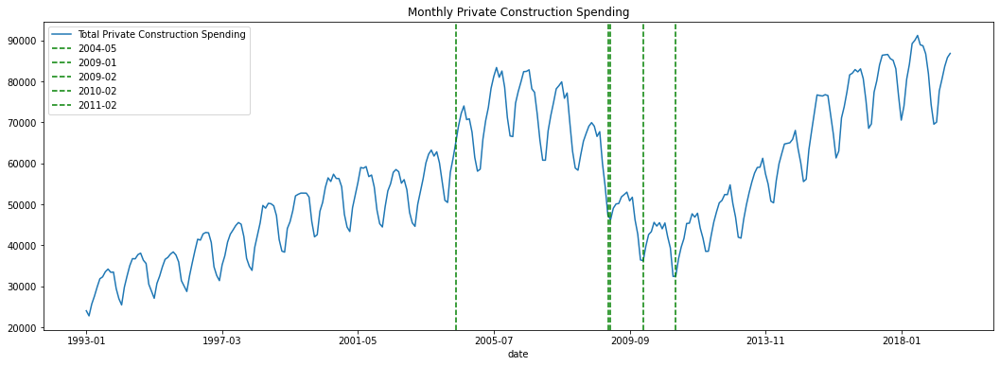

In [39]:
# Plot the timeseries and the true changepoint

import matplotlib.pyplot as plt 
from matplotlib.pyplot import figure 
from load_dataset import TimeSeries 

path = str('TCPD-master/datasets/' + dataset + '/' + dataset + '.json')
ts = TimeSeries.from_json(path)
dataset_df = ts.df
dataset_df['date'] =ts.datestr
#print(dataset_df.dtypes)
column_name = 'Total Private Construction Spending'
dataset_df.plot('date', column_name,figsize=(18, 6))
dataset_df['is_CPD'] = np.where(dataset_df.t.isin(dataset_annotation_lst), 1,0)
plt.axvline(dataset_df.loc[dataset_df['is_CPD']==1][['t']].values[0], color='green', linestyle='--', label='2004-05')
plt.axvline(dataset_df.loc[dataset_df['is_CPD']==1][['t']].values[1], color='green', linestyle='--', label='2009-01')
plt.axvline(dataset_df.loc[dataset_df['is_CPD']==1][['t']].values[2], color='green', linestyle='--', label='2009-02')
plt.axvline(dataset_df.loc[dataset_df['is_CPD']==1][['t']].values[3], color='green', linestyle='--', label='2010-02')
plt.axvline(dataset_df.loc[dataset_df['is_CPD']==1][['t']].values[4], color='green', linestyle='--', label='2011-02')
plt.legend()
plt.title("Monthly Private Construction Spending")
true_cp = dataset_df.iloc[32]['date']

#### Detect and plot the changepoints using BOCPD NORMAL_KNOWN_MODEL

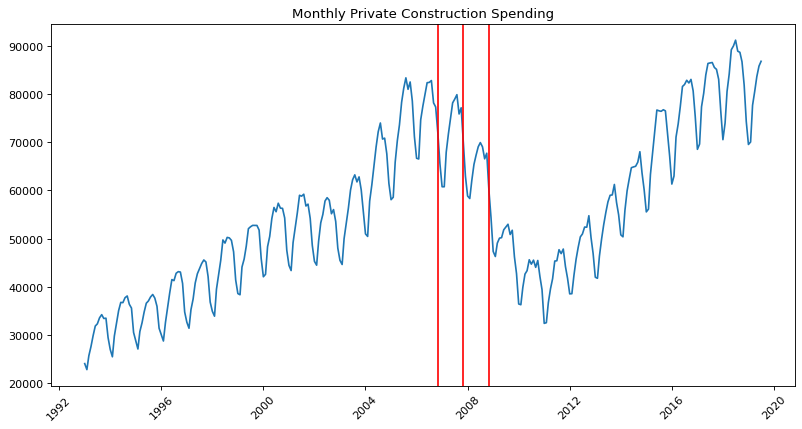

Detected changepoint(s): 


[(TimeSeriesChangePoint(start_time: 2006-11-01T00:00:00.000000000, end_time: 2006-11-01T00:00:00.000000000, confidence: 0.5643137326336457),
  <kats.detectors.bocpd.BOCPDMetadata at 0x7f90015439d0>),
 (TimeSeriesChangePoint(start_time: 2007-11-01T00:00:00.000000000, end_time: 2007-11-01T00:00:00.000000000, confidence: 0.6217542998560829),
  <kats.detectors.bocpd.BOCPDMetadata at 0x7f90015438e0>),
 (TimeSeriesChangePoint(start_time: 2008-11-01T00:00:00.000000000, end_time: 2008-11-01T00:00:00.000000000, confidence: 0.6349703667802497),
  <kats.detectors.bocpd.BOCPDMetadata at 0x7f9001543e20>)]

In [40]:
## Detect changepoints in the Private Construction Spending timeseries with BOCP Detector algorithm

from kats.detectors.bocpd import BOCPDetector, BOCPDModelType, NormalKnownParameters, TrendChangeParameters, PoissonModelParameters
from kats.consts import TimeSeriesData

df = dataset_df
df['time']= pd.to_datetime(df['date'])
tsd = TimeSeriesData(df.loc[:,['time', column_name]])
detector = BOCPDetector(tsd)

#parameters for normal probability model
model_dist_paramters = NormalKnownParameters()
model_dist_paramters.empirical=True
model_dist_paramters.known_prec_multiplier=[1.0, 2.0, 3.0, 4.0, 5.0]

change_points = detector.detector(
    model=BOCPDModelType.NORMAL_KNOWN_MODEL,
    model_parameters=model_dist_paramters,    
    #changepoint_prior=.1#prior belief    
    #threshold=.5    
)
figure(figsize=(12, 6), dpi=80)
plt.xticks(rotation=45)
plt.title("Monthly Private Construction Spending")
detector.plot(change_points)
print("Detected changepoint(s): ")
change_points

#### Test other BOCPD ModelTypes

#### <font color='red'>TREND_CHANGE_MODEL has error (don't run as it is)</font>

In [ ]:
# Use the TREND_CHANGE_MODEL
detector = BOCPDetector(tsd)

#parameters for normal probability model
model_dist_paramters = TrendChangeParameters()
model_dist_paramters.empirical=True
#model_dist_paramters.known_prec_multiplier=[1.0, 2.0, 3.0, 4.0, 5.0]

change_points = detector.detector(
    model=BOCPDModelType.TREND_CHANGE_MODEL,
    #model_parameters=model_dist_paramters,    
    #changepoint_prior=.1,#prior belief    
    #threshold=.5,
    #lag=10
)
figure(figsize=(12, 6), dpi=80)
plt.xticks(rotation=45)
plt.title("Monthly Private Construction Spending")
detector.plot(change_points)
print("Detected changepoint(s): ")
change_points

#### <font color='red'>POISSON_PROCESS_MODEL has error  (exhaust rejection sampling threshold)</font>

In [ ]:
# Use the POISSON_PROCESS_MODEL
detector = BOCPDetector(tsd)

#parameters for normal probability model
model_dist_paramters = PoissonModelParameters()
model_dist_paramters.empirical=True


change_points = detector.detector(
    model=BOCPDModelType.POISSON_PROCESS_MODEL,
    #model_parameters=model_dist_paramters,    
    lag=10 
)
figure(figsize=(12, 6), dpi=80)
plt.xticks(rotation=45)
plt.title("Monthly Private Construction Spending")
detector.plot(change_points)
print("Detected changepoint(s): ")
change_points

#### Hyperparameter tuning of lag, changepoint_prior, and known_prec_multiplier

In [41]:
# Tune hyperparameters: lag, changepoint_prior, and known_prec_multiplier

# Parse list of changepoints and confidence
def parse_CPs(changepoints):    
    cp_list = []
    for cp in changepoints:
        changepoint = str(cp[0])[34:44]
        confidence = str(cp[0])[119:125]
        cp_list.append(changepoint)
    return cp_list

# Hyperparameter tuning for BOCP algo
def hp_tuning_BOCP(df):

    # Initialize the detector
    detector = BOCPDetector(tsd)    
    hp_list = []
    #hp_result['true_CP_detected'] = []
    lag = 0
    changepoint_prior = .1
    threshold = 0.05
    hp_value = {}
    for i in range(1,20):
        for j in np.arange(0.0, 1.0, 0.1):
            for k in range(1, 10):                
                model_dist_paramters = NormalKnownParameters()
                model_dist_paramters.empirical=True
                model_dist_paramters.known_prec_multiplier=[k]                
                lag = i
                changepoint_prior = j
                change_points = detector.detector(
                    model=BOCPDModelType.NORMAL_KNOWN_MODEL,
                    model_parameters=model_dist_paramters,
                    lag=lag,
                    changepoint_prior=changepoint_prior,
                    threshold=0.05
                )
                hp_value = {'lag': lag, 'changepoint_prior': changepoint_prior,'known_prec_multiplier': model_dist_paramters.known_prec_multiplier, 'CP': parse_CPs(change_points)}
                hp_list.append(hp_value)
    return pd.DataFrame(hp_list)

In [42]:
# Run the hyperparameter tuning methods and export the results to a .csv file

dataset_hp_bocp = hp_tuning_BOCP(tsd)
dataset_hp_bocp.to_csv("Private_Construction_Spending.csv")

In [44]:
# Plot the results of hyperparameter tuning

import hiplot as hip

cp_hiplot = hip.Experiment.from_csv('Private_Construction_Spending.csv')
cp_hiplot.display()

<IPython.core.display.Javascript object>

The exact true changepoints are not detected by algorithms. All the three hyper parameters does not have any impact on the identified changepoints: `lag`, `changepoint_prior` and `known_prec_multiplier`.

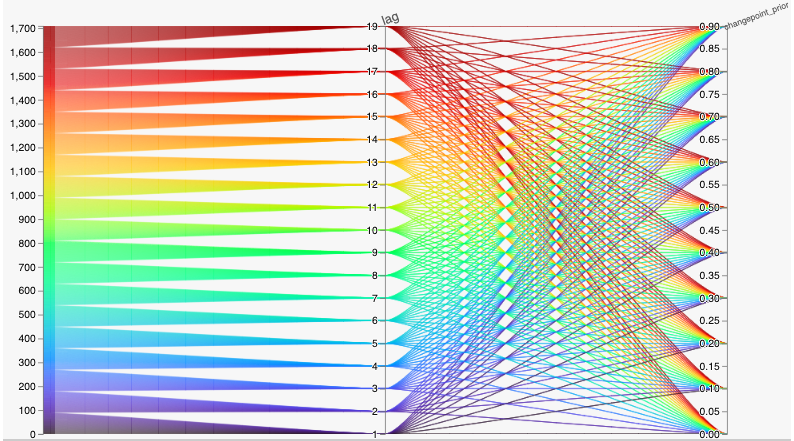

Upon repeating the same hyperparamter sweep for the BOCP Detector algorithm on various timeseries datasets with a different number of datapoints, we observed the following takeaways. 

#### Main Takeaways
1. None of the three hyperparameter have impact on changepoint detected. 
2. The confidence interval is highly dependent on data size. The higher the data size, higher the confidence in changepoint detected.  
3. Out of the three underlying probability distribution model, Normal model detects either the exact changepoints or near changepoint. The Poisson model does not detect much changepoints and exhaust the sampling threshold without detecting.

## Part 2: Applied Research on Google Mobility Data <a name="part2"></a>

With the observations found from the sections prior, we can now apply the KATS algorithms to a larger dataset with over 20,000 rows. We start by exploring the Google Mobility dataset 2020 for the United States which can be downloaded from [here](https://www.google.com/covid19/mobility/).

The data shows how visits to places, such as grocery stores and parks, are changing in each geographic region compared to a baseline. The baseline is the median value, for the corresponding day of the week, during the five week period Jan 3–Feb 6, 2020. For each region-category, the baseline isn’t a single value. It is seven individual values. The same number of visitors on two different days of the week result in different percentage changes.
Larger changes do not mean more visitors and smaller changes do not mean less visitors. Day to day comparison of changes will lead to misleading results. 
Mobility trends are measured across six broad categories:
* Residential: places of residence.
* Grocery & Pharmacy stores: places like grocery markets, food warehouses, farmers markets, specialty food shops, drug stores, and pharmacies.
* Workplaces: places of work.
* Parks: places like local parks, national parks, public beaches, marinas, dog parks, plazas, and public gardens.
* Transit stations: places like public transport hubs such as subway, bus, and train stations.
* Retail & Recreation: places like restaurants, cafes, shopping centers, theme parks, museums, libraries, and movie theaters.

The 'Residential' category shows a change in duration, while the other categories measure a change in total visitors.
The dataset has 812065 observations and 15 features. The data is completely anonymized from users who have turned on the Location History setting, which is off by default. If there’s not enough data for an estimate of change from the baseline, that means Google wasn’t able to confidently and anonymously compute the estimate.

### Methodology

In this section, we apply each changepoint detection algorithm to the Google Mobility dataset, focusing on the King County data as an example, to validate our conclusions about optimal parameters from Part A. 

The purpose of applying the KATS changepoint algorithms to the Google Mobility dataset is to explore how the algorithms behave in a real data scenario where catalyst dates are known, but the changepoints are unknown. The time when a change is announced may differ than the time when the change is observed in effect. We attempt to observe this effect via the different trends in the Google Mobility dataset in this section. 

The Google Mobility dataset contains 6 different types of mobility cases. Each of these has a unique time series shape and in this section we strive to explore which algorithm better captures key changepoints during the duration of Covid-19.

#### Plot each timeseries

In [2]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd 
df=pd.read_csv('Global_Mobility_Report.csv')
df=df.loc[df.country_region_code=='US']
df=df[df.sub_region_1=='Washington']
df=df[df.sub_region_2=='King County']

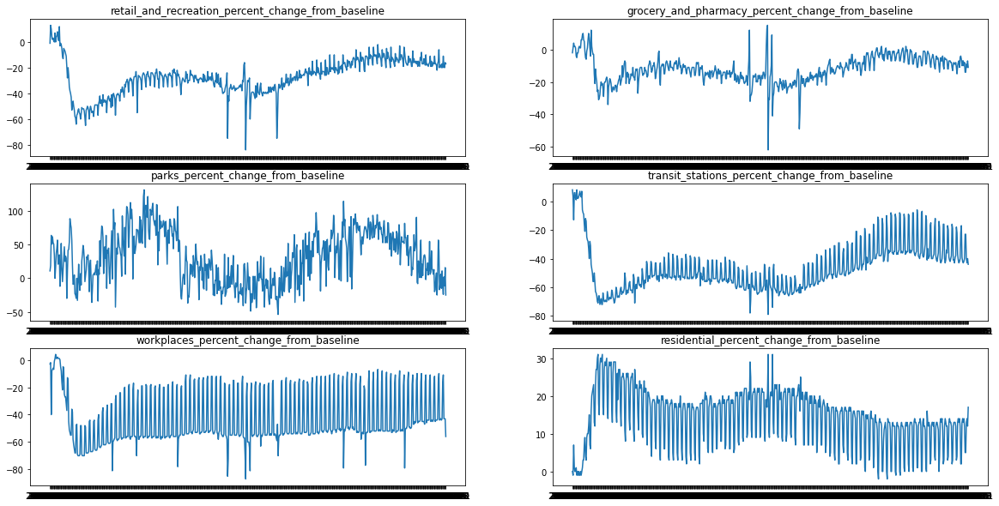

In [3]:
import matplotlib.pyplot as plt

figure, axis = plt.subplots(3, 2,figsize=(20,10))
fig1 = axis[0, 0].plot(df['date'], df['retail_and_recreation_percent_change_from_baseline'])
fig1 = axis[0, 0].set_title("retail_and_recreation_percent_change_from_baseline")
fig2 = axis[0, 1].plot(df['date'], df['grocery_and_pharmacy_percent_change_from_baseline'])
fig2 = axis[0, 1].set_title("grocery_and_pharmacy_percent_change_from_baseline")
fig3 = axis[1, 0].plot(df['date'], df['parks_percent_change_from_baseline'])
fig3 = axis[1, 0].set_title("parks_percent_change_from_baseline")
fig4 = axis[1, 1].plot(df['date'], df['transit_stations_percent_change_from_baseline'])
fig4 = axis[1, 1].set_title("transit_stations_percent_change_from_baseline")
fig5 = axis[2, 0].plot(df['date'], df['workplaces_percent_change_from_baseline'])
fig5 = axis[2, 0].set_title("workplaces_percent_change_from_baseline")
fig6 = axis[2, 1].plot(df['date'], df['residential_percent_change_from_baseline'])
fig6 = axis[2, 1].set_title("residential_percent_change_from_baseline")

title_list = ['retail_and_recreation_percent_change_from_baseline', 'grocery_and_pharmacy_percent_change_from_baseline', 'parks_percent_change_from_baseline', 'transit_stations_percent_change_from_baseline', 'workplaces_percent_change_from_baseline' , 'residential_percent_change_from_baseline']

### 2a. Application of CUSUMDetector <a name="part2a"></a>

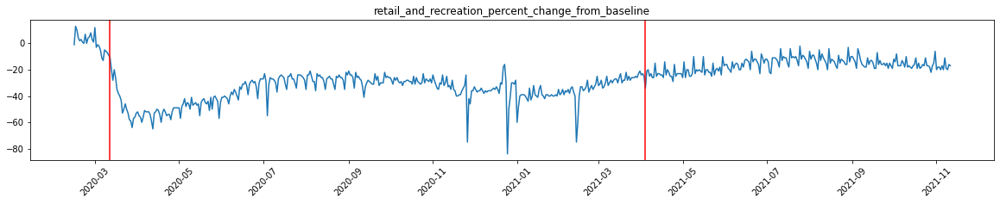

0: (TimeSeriesChangePoint(start_time: 2021-04-04 00:00:00, end_time: 2021-04-04 00:00:00, confidence: 1.0), <kats.detectors.cusum_detection.CUSUMMetadata object at 0x7fe7c7b90760>)
1: (TimeSeriesChangePoint(start_time: 2020-03-12 00:00:00, end_time: 2020-03-12 00:00:00, confidence: 1.0), <kats.detectors.cusum_detection.CUSUMMetadata object at 0x7fe7c97c1fa0>)


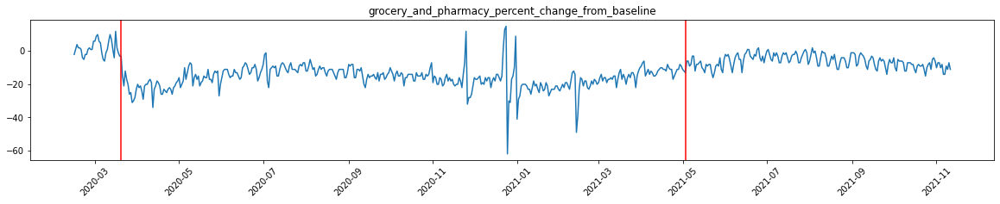

0: (TimeSeriesChangePoint(start_time: 2021-05-03 00:00:00, end_time: 2021-05-03 00:00:00, confidence: 1.0), <kats.detectors.cusum_detection.CUSUMMetadata object at 0x7fe7ca61c1c0>)
1: (TimeSeriesChangePoint(start_time: 2020-03-20 00:00:00, end_time: 2020-03-20 00:00:00, confidence: 1.0), <kats.detectors.cusum_detection.CUSUMMetadata object at 0x7fe7ca627af0>)


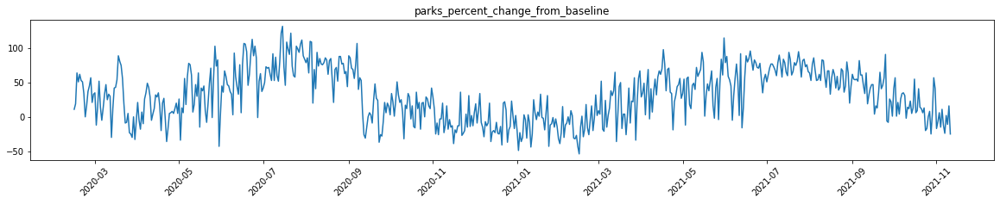

0: (TimeSeriesChangePoint(start_time: 2021-03-29 00:00:00, end_time: 2021-03-29 00:00:00, confidence: 0.9999999999964628), <kats.detectors.cusum_detection.CUSUMMetadata object at 0x7fe7ca794dc0>)
1: (TimeSeriesChangePoint(start_time: 2020-09-10 00:00:00, end_time: 2020-09-10 00:00:00, confidence: 0.9999999999984178), <kats.detectors.cusum_detection.CUSUMMetadata object at 0x7fe7ca79a190>)


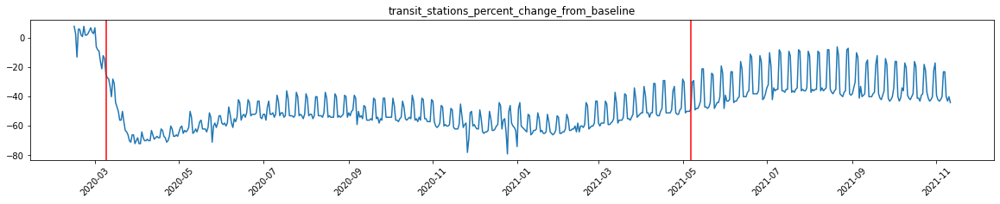

0: (TimeSeriesChangePoint(start_time: 2021-05-07 00:00:00, end_time: 2021-05-07 00:00:00, confidence: 1.0), <kats.detectors.cusum_detection.CUSUMMetadata object at 0x7fe7ca471e20>)
1: (TimeSeriesChangePoint(start_time: 2020-03-09 00:00:00, end_time: 2020-03-09 00:00:00, confidence: 1.0), <kats.detectors.cusum_detection.CUSUMMetadata object at 0x7fe7ca4719d0>)


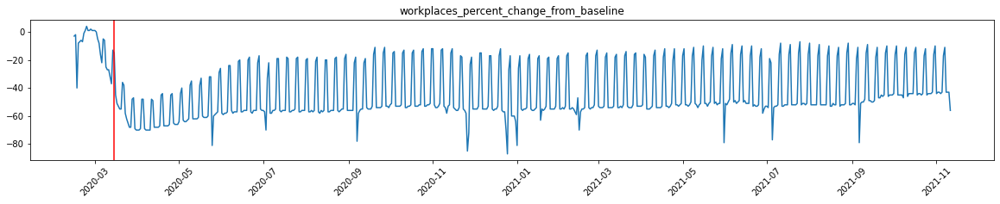

0: (TimeSeriesChangePoint(start_time: 2021-04-16 00:00:00, end_time: 2021-04-16 00:00:00, confidence: 0.9926003975580808), <kats.detectors.cusum_detection.CUSUMMetadata object at 0x7fe7ca422a90>)
1: (TimeSeriesChangePoint(start_time: 2020-03-15 00:00:00, end_time: 2020-03-15 00:00:00, confidence: 1.0), <kats.detectors.cusum_detection.CUSUMMetadata object at 0x7fe7ca644370>)


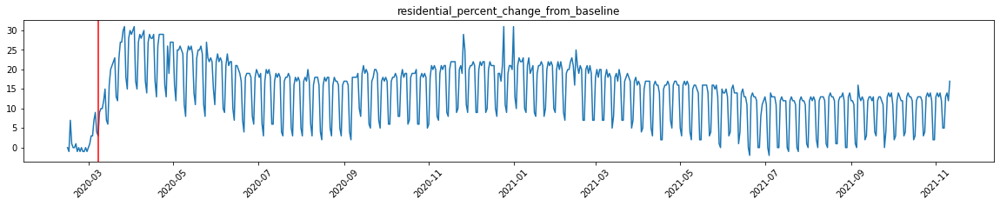

0: (TimeSeriesChangePoint(start_time: 2020-03-08 00:00:00, end_time: 2020-03-08 00:00:00, confidence: 0.9999999999999999), <kats.detectors.cusum_detection.CUSUMMetadata object at 0x7fe7ca422880>)
1: (TimeSeriesChangePoint(start_time: 2021-04-02 00:00:00, end_time: 2021-04-02 00:00:00, confidence: 1.0), <kats.detectors.cusum_detection.CUSUMMetadata object at 0x7fe7c915ce50>)


In [7]:
# import packages for cusum
from kats.detectors.cusum_detection import CUSUMDetector
from kats.consts import TimeSeriesData,TimeSeriesChangePoint

df['time']=pd.to_datetime(df['date'])

tsd1 = TimeSeriesData(df.loc[:,['time', 'retail_and_recreation_percent_change_from_baseline']])
tsd2 = TimeSeriesData(df.loc[:,['time', 'grocery_and_pharmacy_percent_change_from_baseline']])
tsd3 = TimeSeriesData(df.loc[:,['time', 'parks_percent_change_from_baseline']])
tsd4 = TimeSeriesData(df.loc[:,['time', 'transit_stations_percent_change_from_baseline']])
tsd5 = TimeSeriesData(df.loc[:,['time', 'workplaces_percent_change_from_baseline']])
tsd6 = TimeSeriesData(df.loc[:,['time', 'residential_percent_change_from_baseline']])
tsd_list = [tsd1, tsd2, tsd3, tsd4, tsd5, tsd6]
fig_list = [fig1, fig2, fig3, fig4, fig5, fig6]

for i in range(0,6):
    detector = CUSUMDetector(tsd_list[i])
    change_points = detector.detector(return_all_changepoints=True)
    plt.rcParams["figure.figsize"] = (20,3)
    plt.title(title_list[i])
    plt.xticks(rotation=45)
    fig_list[i] = detector.plot(change_points)
    j = 0
    for entry in change_points:
      print(str(j) + ":", entry)
      j += 1

### 2b. Application of BOCPDetector <a name="part2b"></a>

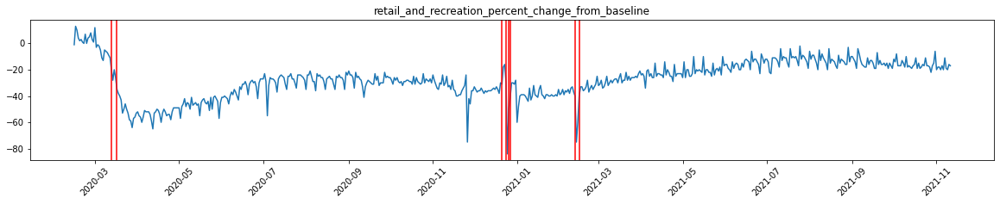

0: (TimeSeriesChangePoint(start_time: 2020-03-13T00:00:00.000000000, end_time: 2020-03-13T00:00:00.000000000, confidence: 0.6449633533660475), <kats.detectors.bocpd.BOCPDMetadata object at 0x7fe7be061460>)
1: (TimeSeriesChangePoint(start_time: 2020-03-17T00:00:00.000000000, end_time: 2020-03-17T00:00:00.000000000, confidence: 0.5734349609605085), <kats.detectors.bocpd.BOCPDMetadata object at 0x7fe7c7323a90>)
2: (TimeSeriesChangePoint(start_time: 2020-12-21T00:00:00.000000000, end_time: 2020-12-21T00:00:00.000000000, confidence: 0.605730029744004), <kats.detectors.bocpd.BOCPDMetadata object at 0x7fe7c6cf52e0>)
3: (TimeSeriesChangePoint(start_time: 2020-12-24T00:00:00.000000000, end_time: 2020-12-24T00:00:00.000000000, confidence: 0.9799866236723197), <kats.detectors.bocpd.BOCPDMetadata object at 0x7fe7c6cf5d60>)
4: (TimeSeriesChangePoint(start_time: 2020-12-26T00:00:00.000000000, end_time: 2020-12-26T00:00:00.000000000, confidence: 0.6767852959190367), <kats.detectors.bocpd.BOCPDMetadat

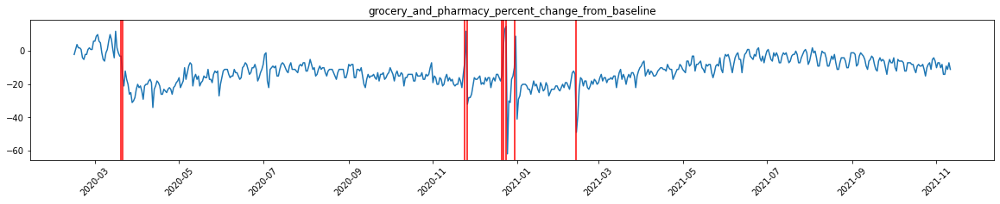

0: (TimeSeriesChangePoint(start_time: 2020-03-20T00:00:00.000000000, end_time: 2020-03-20T00:00:00.000000000, confidence: 0.5144251518998189), <kats.detectors.bocpd.BOCPDMetadata object at 0x7fe87dad5e50>)
1: (TimeSeriesChangePoint(start_time: 2020-03-21T00:00:00.000000000, end_time: 2020-03-21T00:00:00.000000000, confidence: 0.5431934137148369), <kats.detectors.bocpd.BOCPDMetadata object at 0x7fe7c6e2bfd0>)
2: (TimeSeriesChangePoint(start_time: 2020-11-24T00:00:00.000000000, end_time: 2020-11-24T00:00:00.000000000, confidence: 0.764963031656905), <kats.detectors.bocpd.BOCPDMetadata object at 0x7fe7c7811190>)
3: (TimeSeriesChangePoint(start_time: 2020-11-26T00:00:00.000000000, end_time: 2020-11-26T00:00:00.000000000, confidence: 0.8708412220331878), <kats.detectors.bocpd.BOCPDMetadata object at 0x7fe7c7811f70>)
4: (TimeSeriesChangePoint(start_time: 2020-12-21T00:00:00.000000000, end_time: 2020-12-21T00:00:00.000000000, confidence: 0.5493512268287809), <kats.detectors.bocpd.BOCPDMetadat

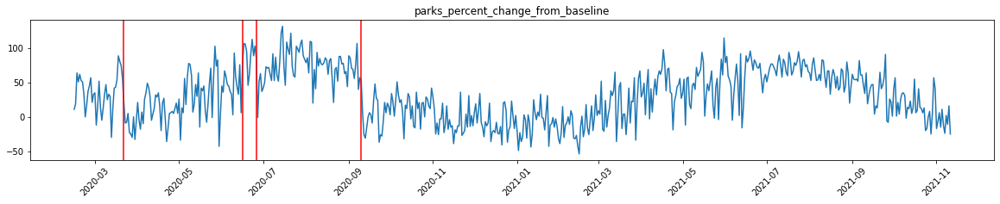

0: (TimeSeriesChangePoint(start_time: 2020-03-22T00:00:00.000000000, end_time: 2020-03-22T00:00:00.000000000, confidence: 0.5886695024793278), <kats.detectors.bocpd.BOCPDMetadata object at 0x7fe7be061ee0>)
1: (TimeSeriesChangePoint(start_time: 2020-06-16T00:00:00.000000000, end_time: 2020-06-16T00:00:00.000000000, confidence: 0.7397638217497791), <kats.detectors.bocpd.BOCPDMetadata object at 0x7fe7c6cf5a60>)
2: (TimeSeriesChangePoint(start_time: 2020-06-26T00:00:00.000000000, end_time: 2020-06-26T00:00:00.000000000, confidence: 0.6623191270842163), <kats.detectors.bocpd.BOCPDMetadata object at 0x7fe7ba053eb0>)
3: (TimeSeriesChangePoint(start_time: 2020-09-10T00:00:00.000000000, end_time: 2020-09-10T00:00:00.000000000, confidence: 0.5795082215206614), <kats.detectors.bocpd.BOCPDMetadata object at 0x7fe7ba084f70>)


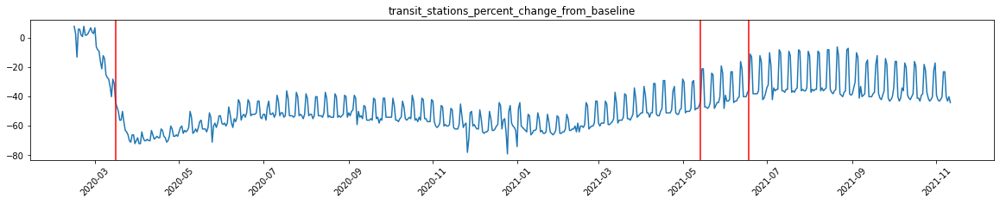

0: (TimeSeriesChangePoint(start_time: 2020-03-16T00:00:00.000000000, end_time: 2020-03-16T00:00:00.000000000, confidence: 0.5114881902737165), <kats.detectors.bocpd.BOCPDMetadata object at 0x7fe7c3e459a0>)
1: (TimeSeriesChangePoint(start_time: 2021-05-14T00:00:00.000000000, end_time: 2021-05-14T00:00:00.000000000, confidence: 0.6931870045808584), <kats.detectors.bocpd.BOCPDMetadata object at 0x7fe7c3e53d90>)
2: (TimeSeriesChangePoint(start_time: 2021-06-18T00:00:00.000000000, end_time: 2021-06-18T00:00:00.000000000, confidence: 0.6573076199354785), <kats.detectors.bocpd.BOCPDMetadata object at 0x7fe7c3e48460>)


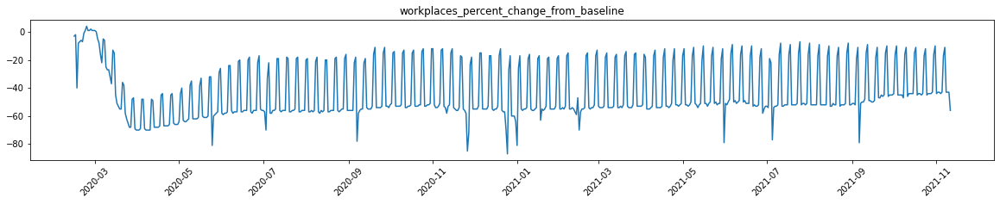

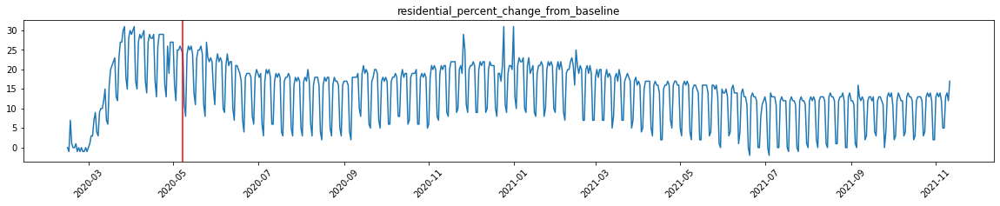

0: (TimeSeriesChangePoint(start_time: 2020-05-08T00:00:00.000000000, end_time: 2020-05-08T00:00:00.000000000, confidence: 0.5105019350420882), <kats.detectors.bocpd.BOCPDMetadata object at 0x7fe7ba068df0>)


In [4]:
# import package
from kats.detectors.bocpd import BOCPDetector, BOCPDModelType, NormalKnownParameters, TrendChangeParameters, PoissonModelParameters
from kats.consts import TimeSeriesData

df['time']=pd.to_datetime(df['date'])

tsd1 = TimeSeriesData(df.loc[:,['time', 'retail_and_recreation_percent_change_from_baseline']])
tsd2 = TimeSeriesData(df.loc[:,['time', 'grocery_and_pharmacy_percent_change_from_baseline']])
tsd3 = TimeSeriesData(df.loc[:,['time', 'parks_percent_change_from_baseline']])
tsd4 = TimeSeriesData(df.loc[:,['time', 'transit_stations_percent_change_from_baseline']])
tsd5 = TimeSeriesData(df.loc[:,['time', 'workplaces_percent_change_from_baseline']])
tsd6 = TimeSeriesData(df.loc[:,['time', 'residential_percent_change_from_baseline']])
tsd_list = [tsd1, tsd2, tsd3, tsd4, tsd5, tsd6]
fig_list = [fig1, fig2, fig3, fig4, fig5, fig6]

#parameters for normal probability model
model_dist_paramters = NormalKnownParameters()
model_dist_paramters.empirical=True
model_dist_paramters.known_prec_multiplier=[1.0, 2.0, 3.0, 4.0, 5.0]

for i in range(0,6):
    detector = BOCPDetector(tsd_list[i])
    change_points = detector.detector(model=BOCPDModelType.NORMAL_KNOWN_MODEL, model_parameters=model_dist_paramters,)
    plt.title(title_list[i])
    plt.rcParams["figure.figsize"] = (20,3)
    plt.xticks(rotation=45)
    fig_list[i] = detector.plot(change_points)
    j = 0
    for entry in change_points:
      print(str(j) + ":", entry)
      j += 1

### 2c. Application of RSDetector <a name="part2c"></a>

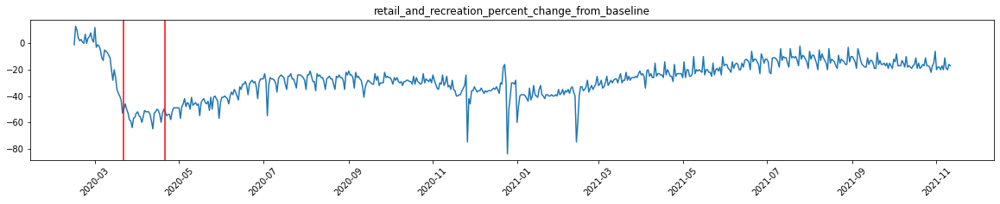

0: (TimeSeriesChangePoint(start_time: 2020-03-22T00:00:00.000000000, end_time: 2020-03-22T00:00:00.000000000, confidence: 0.9630651347279431), <kats.detectors.robust_stat_detection.RobustStatMetadata object at 0x7fd234947520>)
1: (TimeSeriesChangePoint(start_time: 2020-04-21T00:00:00.000000000, end_time: 2020-04-21T00:00:00.000000000, confidence: 0.9912338053998961), <kats.detectors.robust_stat_detection.RobustStatMetadata object at 0x7fd2338b7310>)


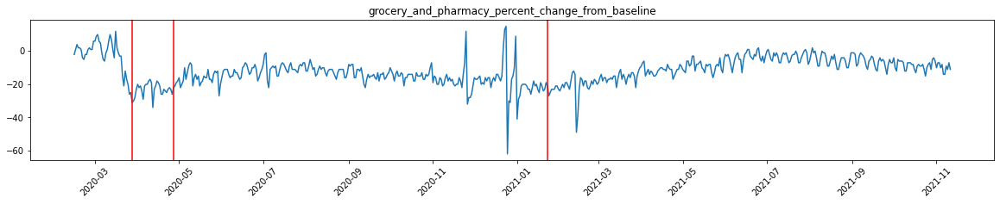

0: (TimeSeriesChangePoint(start_time: 2020-03-28T00:00:00.000000000, end_time: 2020-03-28T00:00:00.000000000, confidence: 0.9570775697341597), <kats.detectors.robust_stat_detection.RobustStatMetadata object at 0x7fd235487e80>)
1: (TimeSeriesChangePoint(start_time: 2020-04-27T00:00:00.000000000, end_time: 2020-04-27T00:00:00.000000000, confidence: 0.9740714578123842), <kats.detectors.robust_stat_detection.RobustStatMetadata object at 0x7fd234d7e430>)
2: (TimeSeriesChangePoint(start_time: 2021-01-23T00:00:00.000000000, end_time: 2021-01-23T00:00:00.000000000, confidence: 0.9549696199120609), <kats.detectors.robust_stat_detection.RobustStatMetadata object at 0x7fd2358ece20>)


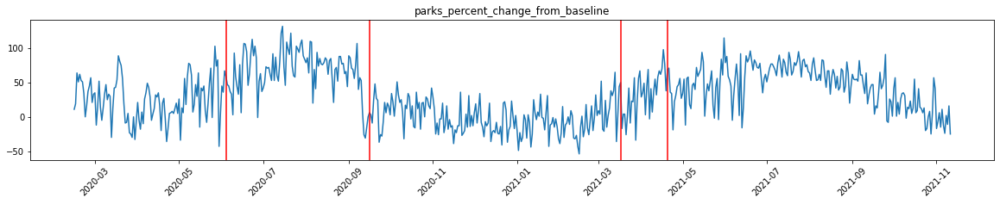

0: (TimeSeriesChangePoint(start_time: 2020-06-04T00:00:00.000000000, end_time: 2020-06-04T00:00:00.000000000, confidence: 0.9535495431223564), <kats.detectors.robust_stat_detection.RobustStatMetadata object at 0x7fd235a62940>)
1: (TimeSeriesChangePoint(start_time: 2020-09-16T00:00:00.000000000, end_time: 2020-09-16T00:00:00.000000000, confidence: 0.9559817729223719), <kats.detectors.robust_stat_detection.RobustStatMetadata object at 0x7fd235a62c70>)
2: (TimeSeriesChangePoint(start_time: 2021-03-17T00:00:00.000000000, end_time: 2021-03-17T00:00:00.000000000, confidence: 0.9569800240972662), <kats.detectors.robust_stat_detection.RobustStatMetadata object at 0x7fd23531a9a0>)
3: (TimeSeriesChangePoint(start_time: 2021-04-20T00:00:00.000000000, end_time: 2021-04-20T00:00:00.000000000, confidence: 0.9637117958900592), <kats.detectors.robust_stat_detection.RobustStatMetadata object at 0x7fd2338b77c0>)


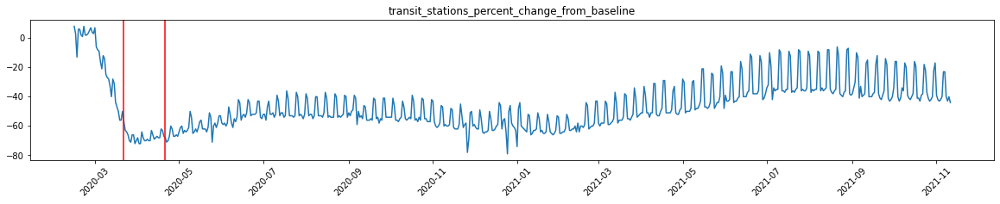

0: (TimeSeriesChangePoint(start_time: 2020-03-22T00:00:00.000000000, end_time: 2020-03-22T00:00:00.000000000, confidence: 0.9699200917114608), <kats.detectors.robust_stat_detection.RobustStatMetadata object at 0x7fd235c023d0>)
1: (TimeSeriesChangePoint(start_time: 2020-04-21T00:00:00.000000000, end_time: 2020-04-21T00:00:00.000000000, confidence: 0.9837972583789883), <kats.detectors.robust_stat_detection.RobustStatMetadata object at 0x7fd235c024c0>)


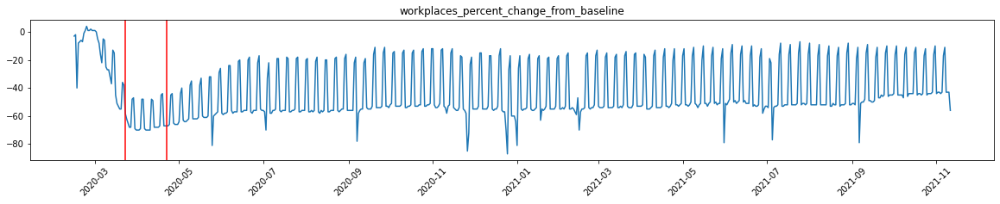

0: (TimeSeriesChangePoint(start_time: 2020-03-23T00:00:00.000000000, end_time: 2020-03-23T00:00:00.000000000, confidence: 0.9651230237531425), <kats.detectors.robust_stat_detection.RobustStatMetadata object at 0x7fd235bee790>)
1: (TimeSeriesChangePoint(start_time: 2020-04-22T00:00:00.000000000, end_time: 2020-04-22T00:00:00.000000000, confidence: 0.9833719837636933), <kats.detectors.robust_stat_detection.RobustStatMetadata object at 0x7fd235c08280>)


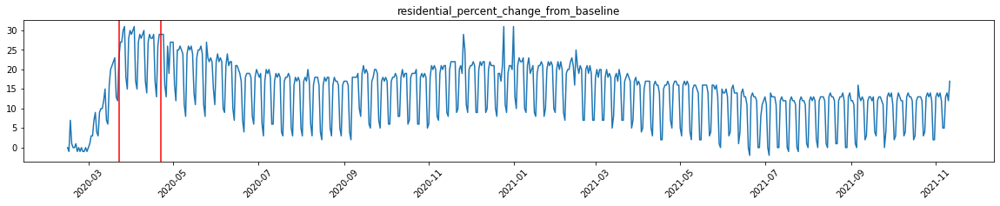

0: (TimeSeriesChangePoint(start_time: 2020-03-23T00:00:00.000000000, end_time: 2020-03-23T00:00:00.000000000, confidence: 0.9759622237346048), <kats.detectors.robust_stat_detection.RobustStatMetadata object at 0x7fd235a84a00>)
1: (TimeSeriesChangePoint(start_time: 2020-04-22T00:00:00.000000000, end_time: 2020-04-22T00:00:00.000000000, confidence: 0.9835779329976578), <kats.detectors.robust_stat_detection.RobustStatMetadata object at 0x7fd235a84a60>)


In [7]:
# import package
from kats.consts import TimeSeriesData
from kats.detectors.robust_stat_detection import RobustStatDetector
import matplotlib

df['time']=pd.to_datetime(df['date'])

tsd1 = TimeSeriesData(df.loc[:,['time', 'retail_and_recreation_percent_change_from_baseline']])
tsd2 = TimeSeriesData(df.loc[:,['time', 'grocery_and_pharmacy_percent_change_from_baseline']])
tsd3 = TimeSeriesData(df.loc[:,['time', 'parks_percent_change_from_baseline']])
tsd4 = TimeSeriesData(df.loc[:,['time', 'transit_stations_percent_change_from_baseline']])
tsd5 = TimeSeriesData(df.loc[:,['time', 'workplaces_percent_change_from_baseline']])
tsd6 = TimeSeriesData(df.loc[:,['time', 'residential_percent_change_from_baseline']])
tsd_list = [tsd1, tsd2, tsd3, tsd4, tsd5, tsd6]
fig_list = [fig1, fig2, fig3, fig4, fig5, fig6]


for i in range(0,6):
    detector = RobustStatDetector(tsd_list[i])
    change_points = detector.detector(comparison_window=15, smoothing_window_size=30, p_value_cutoff=0.05)
    plt.title(title_list[i])
    plt.rcParams["figure.figsize"] = (20,3)
    plt.xticks(rotation=45)
    fig_list[i] = detector.plot(change_points)
    j = 0
    for entry in change_points:
      print(str(j) + ":", entry)
      j += 1